In [1]:
import os
import sys

# 1. 指定專案根目錄的絕對路徑
root_path = r"C:\Users\user\PycharmProjects\subclass_segformer"

# 2. 切換工作目錄 (解決讀取 yaml 或圖片時，相對路徑報錯的問題)
os.chdir(root_path)
print("已切換工作目錄至:", os.getcwd())

# 3. 將根目錄加入系統路徑 (解決 import 自定義模組出現 ModuleNotFoundError 的問題)
if root_path not in sys.path:
    sys.path.append(root_path)
    print("已將根目錄加入 sys.path")

已切換工作目錄至: C:\Users\user\PycharmProjects\subclass_segformer


In [4]:
import os
import sys
import yaml
import torch
import random
import numpy as np
from torch.utils.data import DataLoader
import torch.nn.functional as F
from pathlib import Path
from datetime import datetime

# --- 切換根目錄 ---
root_path = r"C:\Users\user\PycharmProjects\subclass_segformer"
os.chdir(root_path)
if root_path not in sys.path:
    sys.path.append(root_path)

from dataset import RippleFeatureDataset, find_source_image
from semseg.models.subclass_segformer_unified import SubclassSegFormer_Unified
from util.analysis_algs import MultiInstanceLearning, MultiInstanceLearning_calculate_w
from util.features_core import extract_mask_positive_instances, extract_point_prompt_instances, get_roi_instances, find_roi_by_bbox

# --- 初始化設定 ---
config_path = 'configs/ripple_prompt.yaml'
with open(config_path) as f:
    cfg = yaml.load(f, Loader=yaml.SafeLoader)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = SubclassSegFormer_Unified(
    backbone=cfg['MODEL']['BACKBONE'],
    num_classes=2,
    num_prompts=cfg.get('PROMPT_LEARNING', {}).get('NUM_PROMPTS', 5)
)
pretrained_path = cfg['MODEL'].get('PRETRAINED', None)
if pretrained_path:
    checkpoint = torch.load(pretrained_path, map_location='cpu', weights_only=False)
    state_dict = checkpoint.get('state_dict', checkpoint) if isinstance(checkpoint, dict) else checkpoint.state_dict()
    model.load_state_dict(state_dict, strict=False)

model.to(device)
model.eval()

Vb = None
for name, param in model.named_parameters():
    if 'Vb' in name:
        Vb = param.detach().cpu().numpy()
        break

# --- 實驗參數設定 ---
domains = ['F', 'G', 'H', 'I', 'J']
k_list = [1, 5, 10]
mil_methods = ['point', 'box', 'mask']
need_negative = True

FOLDS_NUM = 5
MAX_K = max(k_list) # 10

save_dir = Path("Subclass/unified_npy/kshot_boxplot")
save_dir.mkdir(parents=True, exist_ok=True)

print("🚀 開始 K-Shot 實驗並儲存 NPY (F~J)...")

# --- 全局隨機打亂與 Fold 切分準備 ---
rng = random.Random(3402)
unseen_map = cfg['DATASET'].get('UNSEEN_DOMAINS', {})

# --- 主迴圈 ---
for method in mil_methods:
    print(f"\n{'='*50}")
    print(f"啟動提示策略: {method.upper()}")
    print(f"{'='*50}")

    for domain in domains:
        domain_results = {k: [] for k in k_list}
        print(f"\n📊 處理場域: {domain}")

        if domain not in unseen_map:
            print(f"⚠️ 找不到場域 {domain} 的路徑，略過。")
            continue

        label_dir = Path(unseen_map[domain])
        all_labels = sorted(list(label_dir.glob('*.png')))

        paired_pool = []
        for lbl_path in all_labels:
            img_path = find_source_image(str(lbl_path))
            if img_path:
                paired_pool.append((str(img_path), str(lbl_path)))

        total_valid = len(paired_pool)
        if total_valid < FOLDS_NUM * MAX_K:
            print(f"⚠️ [警告] {domain} 資料量 ({total_valid}) 不足 {FOLDS_NUM * MAX_K} 張，Fold 切分可能出錯！")

        # 每個場域打亂一次
        rng.shuffle(paired_pool)

        # 執行 5 個 Fold
        for fold_idx in range(FOLDS_NUM):
            start_idx = fold_idx * MAX_K
            end_idx = start_idx + MAX_K

            # 取出 10 張作為該次實驗的 Prompt 池
            fold_pool = paired_pool[start_idx:end_idx]
            # 剩下的全部作為 Test 池 (保證測試集不包含這 10 張)
            test_pool = paired_pool[:start_idx] + paired_pool[end_idx:]

            # 建立基底 Dataset (參數隨意，我們稍後會直接覆蓋 files)
            test_dataset = RippleFeatureDataset(
                root=cfg['DATASET']['ROOT'], field=[domain], split='val', sample_num=1,
                unseen_map=unseen_map
            )
            # 強制寫入我們切分好的 Test 清單
            test_dataset.files = test_pool
            test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

            for k in k_list:
                # 依據 K 值從 Fold 池中取前 K 張
                current_prompts = fold_pool[:k]

                prompt_dataset = RippleFeatureDataset(
                    root=cfg['DATASET']['ROOT'], field=[domain], split='val', sample_num=1,
                    unseen_map=unseen_map
                )
                # 強制寫入我們準備好的 Prompt 清單
                prompt_dataset.files = current_prompts
                prompt_loader = DataLoader(prompt_dataset, batch_size=1, shuffle=False)

                p_instances_list, n_instances_list = [], []
                with torch.no_grad():
                    for img, lbl in prompt_loader:
                        img, lbl = img.to(device), lbl.to(device)
                        _, subclass_map = model(img)

                        if method == 'mask':
                            p_inst, n_inst = extract_mask_positive_instances(subclass_map, lbl, need_negative=need_negative)
                        elif method == 'box':
                            mask_200 = F.interpolate(lbl.unsqueeze(0).float(), size=(200, 200), mode='nearest').squeeze().cpu().numpy()
                            _, roi_box, _ = find_roi_by_bbox(mask_200, margin_px=20)
                            p_inst, n_inst = get_roi_instances(subclass_map, roi_box, need_negative=need_negative)
                        elif method == 'point':
                            p_inst, n_inst = extract_point_prompt_instances(subclass_map, lbl, kernel_size=7, need_negative=need_negative)

                        if p_inst is not None and len(p_inst) > 0: p_instances_list.append(p_inst)
                        if n_inst is not None and len(n_inst) > 0: n_instances_list.append(n_inst)

                if not p_instances_list:
                    print(f"⚠️ {domain} Fold {fold_idx} K={k} 未萃取到正樣本，給予 IoU 0 分")
                    domain_results[k].append(0.0)
                    continue

                all_p = torch.cat(p_instances_list, dim=0).cpu()
                all_n = torch.cat(n_instances_list, dim=0).cpu() if n_instances_list else None
                optimized_weight = MultiInstanceLearning_calculate_w(all_p, all_n, Vb)

                ious = []
                with torch.no_grad():
                    for img, lbl in test_loader:
                        img, lbl = img.to(device), lbl.to(device)
                        output, _ = model(img, subclass_weight=optimized_weight.to(device))

                        if output.shape[2:] != lbl.shape[1:]:
                            output = F.interpolate(output, size=lbl.shape[1:], mode='bilinear', align_corners=False)

                        pred_mask = torch.argmax(output, dim=1).squeeze(0)
                        gt = lbl.squeeze(0)

                        intersect = torch.logical_and(pred_mask == 1, gt == 1).sum().item()
                        union = torch.logical_or(pred_mask == 1, gt == 1).sum().item()
                        ious.append(intersect / (union + 1e-6))

                mean_iou = np.mean(ious)
                domain_results[k].append(mean_iou)

        # 存檔時加入 method 名稱
        npy_path = save_dir / f"kshot_results_{method}_{domain}.base_npy"
        np.save(npy_path, domain_results, allow_pickle=True)
        print(f"✅ [{method.upper()}] 場域 {domain} 處理完畢，已存檔: {npy_path.name}")

🚀 開始 K-Shot 實驗並儲存 NPY (F~J)...

啟動提示策略: POINT

📊 處理場域: F
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
>>> [Dataset C] F (val): K=1, 分配 1 張。
✅ [POINT] 場域 F 處理完畢，已存檔: kshot_results_point_F.npy

📊 處理場域: G
>>> [Dataset C] G (val): K=1, 分配 1 張。
>>> [Dataset C] G (val): K=1, 分配 1 張。
>>> [Dataset C] G (val): K=1, 分配 1 張。
>>> [Da

✅ POINT 策略圖檔已儲存至: C:\Users\user\PycharmProjects\subclass_segformer\output_prompt\20260715\few_shot_comparison_point_All_Envs_20260715.png


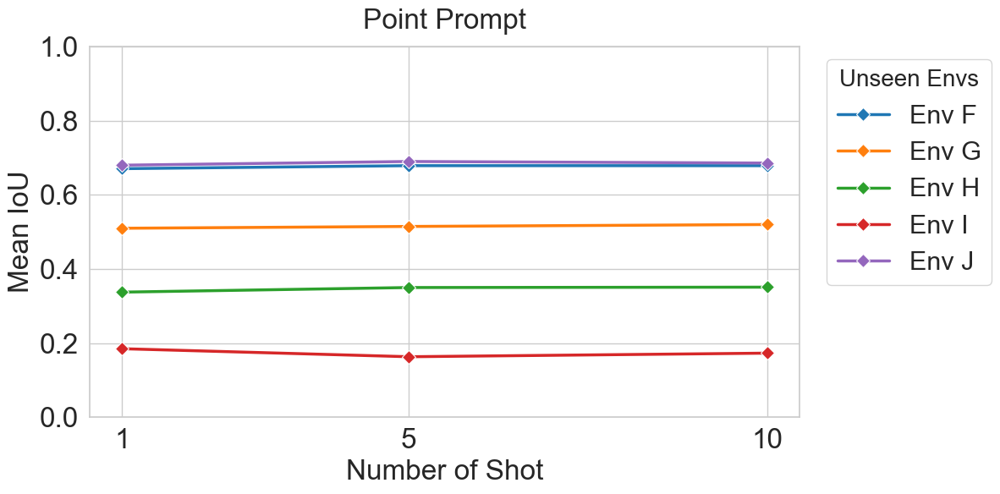

✅ BOX 策略圖檔已儲存至: C:\Users\user\PycharmProjects\subclass_segformer\output_prompt\20260715\few_shot_comparison_box_All_Envs_20260715.png


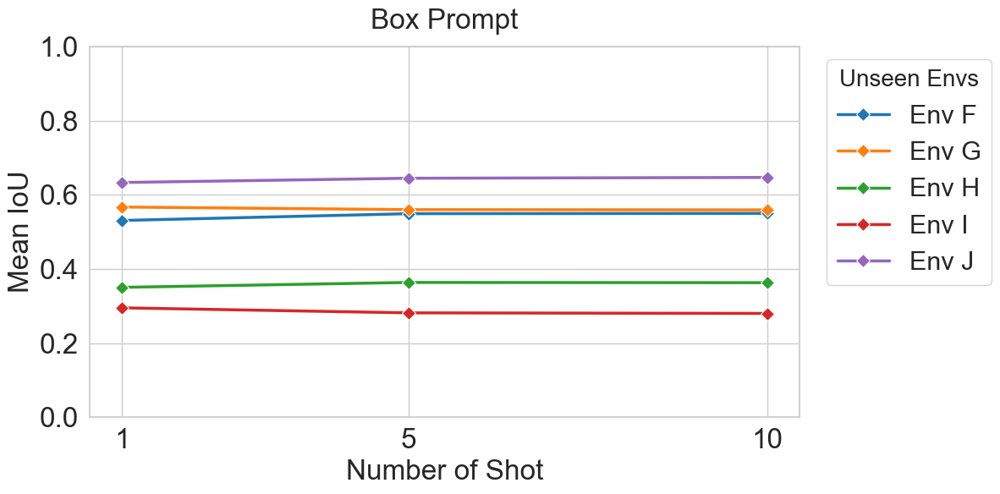

✅ MASK 策略圖檔已儲存至: C:\Users\user\PycharmProjects\subclass_segformer\output_prompt\20260715\few_shot_comparison_mask_All_Envs_20260715.png


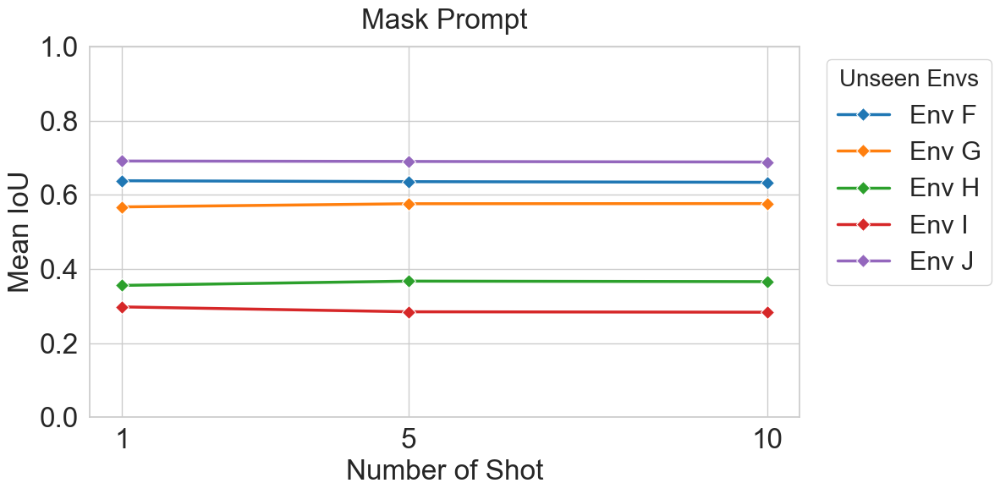

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pathlib import Path
from datetime import datetime

save_dir = Path("Subclass/unified_npy/kshot_boxplot")
domains = ['F', 'G', 'H', 'I', 'J']
k_list = [1, 5, 10]
mil_methods = ['point', 'box', 'mask']

current_date = datetime.now().strftime('%Y%m%d')
output_dir = Path(f'output_prompt/{current_date}')
output_dir.mkdir(parents=True, exist_ok=True)

sns.set_theme(style="whitegrid")

for method in mil_methods:
    data_records = []

    # 讀取該策略下所有場域的資料
    for domain in domains:
        npy_path = save_dir / f"kshot_results_{method}_{domain}.base_npy"
        if not npy_path.exists():
            print(f"⚠️ 找不到 {method} 策略下 {domain} 的 NPY 檔案，跳過。")
            continue

        domain_results = np.load(npy_path, allow_pickle=True).item()

        for k in k_list:
            ious = domain_results[k]
            mean_iou = np.mean(ious)
            data_records.append({
                'Env': f"Env {domain}",
                'K-Shot': k,
                'Mean_IoU': mean_iou
            })

    if not data_records:
        continue

    df = pd.DataFrame(data_records)

    # 繪製圖表
    plt.figure(figsize=(12, 6))

    # 注意：這裡的 hue 必須與 DataFrame 的欄位名稱 'Env' 一致
    sns.lineplot(
        x='K-Shot', y='Mean_IoU', hue='Env', data=df,
        marker='D', linewidth=2.5, markersize=8, palette='tab10'
    )

    # 標題傳達實驗結論：準確度趨勢與特徵飽和現象
    plt.title(f'{method.capitalize()} Prompt', fontsize=24, pad=15)
    plt.xlabel('Number of Shot', fontsize=24)
    plt.ylabel('Mean IoU', fontsize=24)
    plt.xticks(k_list)
    plt.tick_params(axis='both', labelsize=24) # 一次放大 X 軸與 Y 軸的刻度數字
    plt.ylim(0, 1.0)


    plt.legend(
        title='Unseen Envs',
        bbox_to_anchor=(1.02, 1),
        loc='upper left',
        fontsize=22,         # 放大圖例中的文字（Env F, Env G...）
        title_fontsize=20    # 放大圖例標題（Unseen Envs）
    )
    plt.tight_layout()

    # 針對該策略儲存獨立圖檔
    save_path = output_dir / f"few_shot_comparison_{method}_All_Envs_{current_date}.png"
    plt.savefig(save_path, bbox_inches='tight', dpi=300)
    print(f"✅ {method.upper()} 策略圖檔已儲存至: {save_path.absolute()}")

    plt.show()

🚀 啟動【絕對公平比較】實驗！
目標場域：['F', 'G', 'H', 'I', 'J']
尋找單一 Worst Case，確保三種 Prompt 都在同一張圖上生效...


🔍 開始處理場域 [ Domain F ]
>>> [Dataset C] F (val): K=1, 分配 1 張。
⚠️ 在場域 F 找不到能讓三種方法同時進步的共用範例，可嘗試放寬門檻。

🔍 開始處理場域 [ Domain G ]
>>> [Dataset C] G (val): K=1, 分配 1 張。
🎯 找到共用完美範例 (IMG5433_cut_101.jpg)！ Baseline IoU: 28.0%


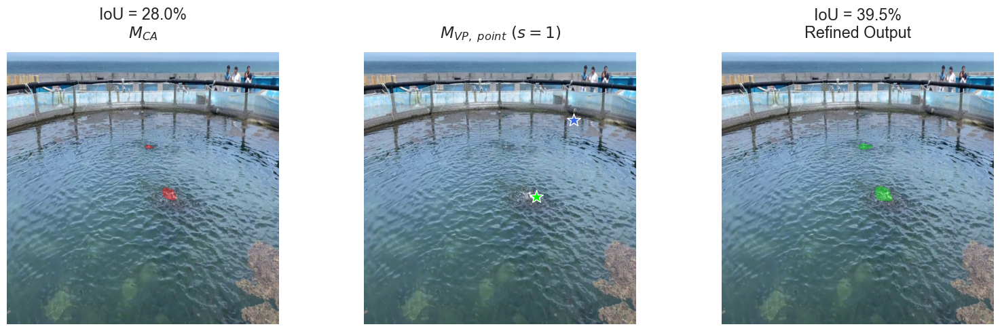

✅ 已輸出 POINT 的比較圖 (IoU 進步至 39.5%)


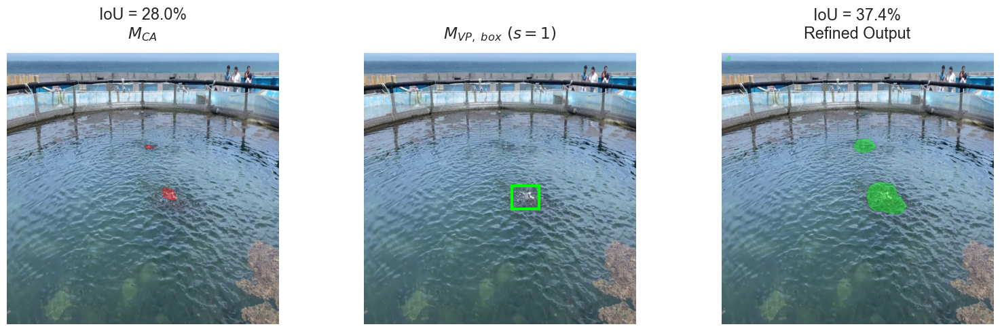

✅ 已輸出 BOX 的比較圖 (IoU 進步至 37.4%)


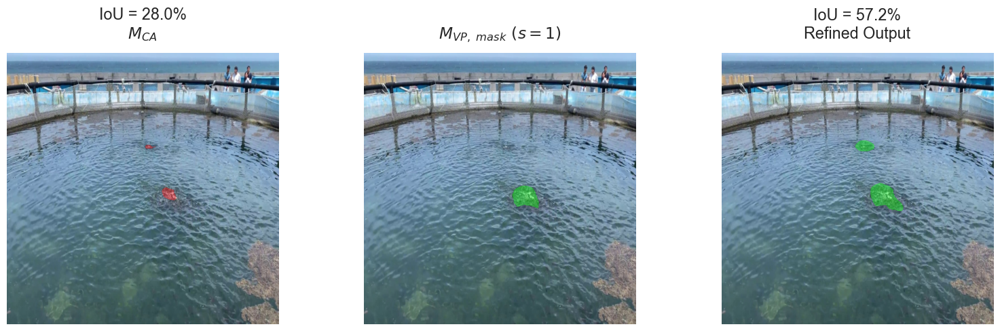

✅ 已輸出 MASK 的比較圖 (IoU 進步至 57.2%)

🔍 開始處理場域 [ Domain H ]
>>> [Dataset C] H (val): K=1, 分配 1 張。
🎯 找到共用完美範例 (video_20201022_145926_cut_104.jpg)！ Baseline IoU: 3.4%


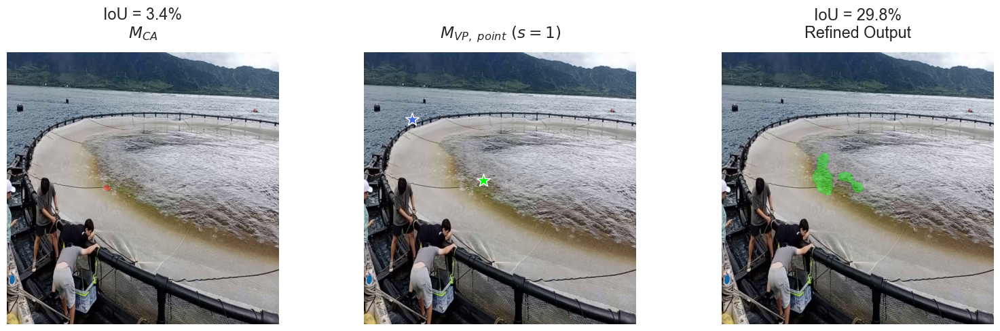

✅ 已輸出 POINT 的比較圖 (IoU 進步至 29.8%)


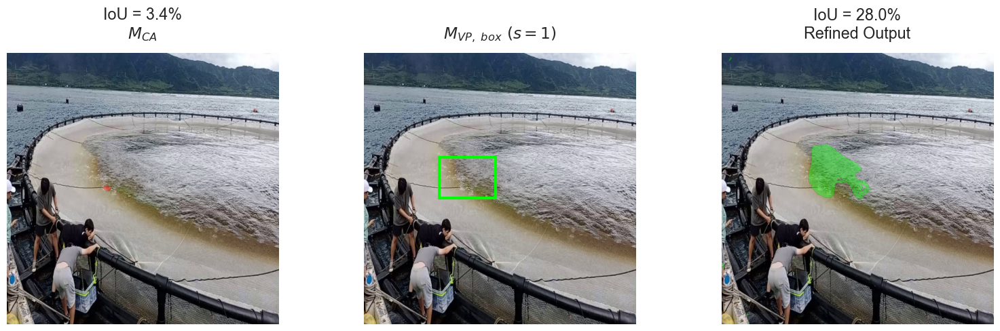

✅ 已輸出 BOX 的比較圖 (IoU 進步至 28.0%)


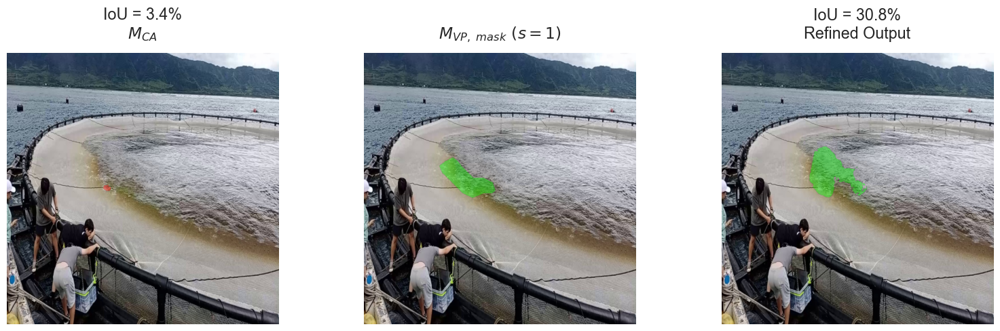

✅ 已輸出 MASK 的比較圖 (IoU 進步至 30.8%)

🔍 開始處理場域 [ Domain I ]
>>> [Dataset C] I (val): K=1, 分配 1 張。
🎯 找到共用完美範例 (video_20201211_151642_cut_218.jpg)！ Baseline IoU: 16.1%


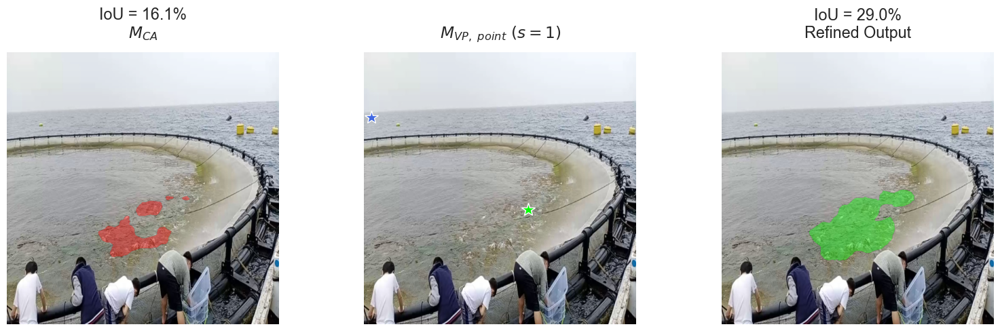

✅ 已輸出 POINT 的比較圖 (IoU 進步至 29.0%)


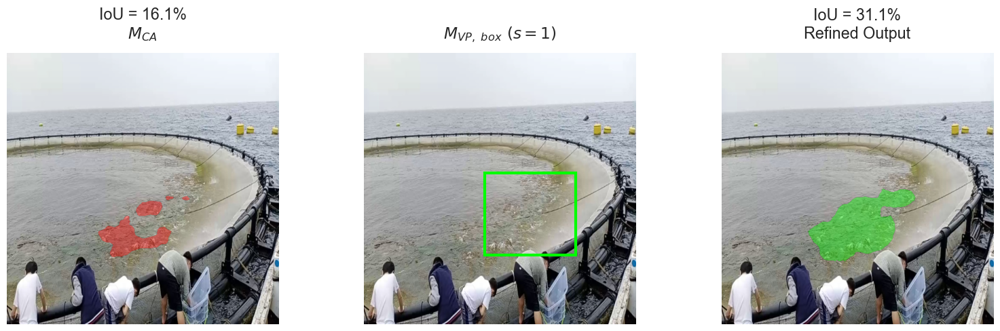

✅ 已輸出 BOX 的比較圖 (IoU 進步至 31.1%)


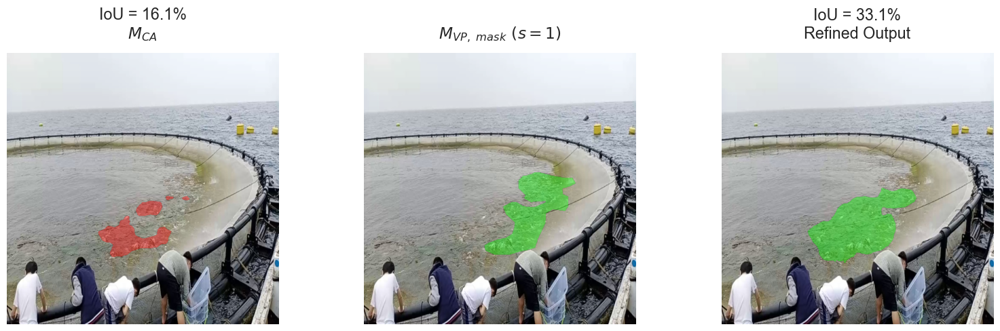

✅ 已輸出 MASK 的比較圖 (IoU 進步至 33.1%)

🔍 開始處理場域 [ Domain J ]
>>> [Dataset C] J (val): K=1, 分配 1 張。
⚠️ 在場域 J 找不到能讓三種方法同時進步的共用範例，可嘗試放寬門檻。


In [9]:
import os
import sys
import yaml
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch.nn.functional as F
from torch.utils.data import DataLoader
from pathlib import Path

# --- 1. 基礎設定與環境初始化 ---
root_path = r"C:\Users\user\PycharmProjects\subclass_segformer"
os.chdir(root_path)
if root_path not in sys.path:
    sys.path.append(root_path)

from dataset import RippleFeatureDataset, find_source_image
from semseg.models.subclass_segformer_unified import SubclassSegFormer_Unified
from util.analysis_algs import MultiInstanceLearning_calculate_w
from util.features_core import extract_mask_positive_instances, extract_point_prompt_instances, get_roi_instances, find_roi_by_bbox

config_path = 'configs/ripple_prompt.yaml'
with open(config_path) as f:
    cfg = yaml.load(f, Loader=yaml.SafeLoader)

unseen_map = cfg['DATASET'].get('UNSEEN_DOMAINS', {})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = SubclassSegFormer_Unified(
    backbone=cfg['MODEL']['BACKBONE'],
    num_classes=2,
    num_prompts=cfg.get('PROMPT_LEARNING', {}).get('NUM_PROMPTS', 5)
)
pretrained_path = cfg['MODEL'].get('PRETRAINED', None)
if pretrained_path:
    checkpoint = torch.load(pretrained_path, map_location='cpu', weights_only=False)
    state_dict = checkpoint.get('state_dict', checkpoint) if isinstance(checkpoint, dict) else checkpoint.state_dict()
    model.load_state_dict(state_dict, strict=False)

model.to(device)
model.eval()

Vb = next((param.detach().cpu().numpy() for name, param in model.named_parameters() if 'Vb' in name), None)


# --- 2. 視覺化輔助函式 ---
def tensor_to_vis_img(img_tensor):
    """將模型 Tensor 反正規化(Denormalize)回真實色彩，確保位置與 Mask 100% 貼合"""
    img_np = img_tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()
    if img_np.min() < 0:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_np = img_np * std + mean
    return np.clip(img_np, 0, 1)

def get_iou_and_mask(output, lbl):
    if output.shape[2:] != lbl.shape[1:]:
        output = F.interpolate(output, size=lbl.shape[1:], mode='bilinear', align_corners=False)
    pred_mask = torch.argmax(output, dim=1).squeeze(0)
    gt = lbl.squeeze(0)
    intersect = torch.logical_and(pred_mask == 1, gt == 1).sum().item()
    union = torch.logical_or(pred_mask == 1, gt == 1).sum().item()
    iou = intersect / (union + 1e-6)
    return iou, pred_mask.cpu().numpy()

def draw_visual_prompt(ax, img_np, lbl_np, method):
    ax.imshow(img_np)
    ax.axis('off')
    if method == 'point':
        pos_y, pos_x = np.where(lbl_np == 1)
        neg_y, neg_x = np.where(lbl_np == 0)
        if len(pos_x) > 0:
            ax.plot(pos_x[len(pos_x)//2], pos_y[len(pos_y)//2], marker='*', color='lime', markersize=15, markeredgecolor='white', linestyle='None')
        if len(neg_x) > 0:
            ax.plot(neg_x[len(neg_x)//4], neg_y[len(neg_y)//4], marker='*', color='royalblue', markersize=15, markeredgecolor='white', linestyle='None')
    elif method == 'box':
        pos_y, pos_x = np.where(lbl_np == 1)
        if len(pos_x) > 0:
            x_min, x_max = pos_x.min(), pos_x.max()
            y_min, y_max = pos_y.min(), pos_y.max()
            rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, linewidth=3, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
    elif method == 'mask':
        green_mask = np.zeros((*lbl_np.shape, 4))
        green_mask[lbl_np == 1] = [0, 1, 0, 0.4]
        ax.imshow(green_mask)

def overlay_segmentation(ax, img_np, pred_mask, color=[0, 1, 0, 0.4]):
    ax.imshow(img_np)
    overlay = np.zeros((*pred_mask.shape, 4))
    overlay[pred_mask == 1] = color
    ax.imshow(overlay)
    ax.axis('off')


# --- 3. 絕對公平比較：尋找單一圖片測試三種方法 ---
def run_fair_interactive_experiment():
    domains = ['F', 'G', 'H', 'I', 'J']
    max_baseline_iou = 0.50
    # 條件：三種方法都必須進步至少 5%，且至少有一種方法進步超過 15% (確保這是一張完美的綜合展示圖)
    min_improvement_all = 0.05
    min_improvement_max = 0.15

    print(f"🚀 啟動【絕對公平比較】實驗！\n目標場域：{domains}\n尋找單一 Worst Case，確保三種 Prompt 都在同一張圖上生效...\n")

    for domain in domains:
        print(f"\n{'='*50}")
        print(f"🔍 開始處理場域 [ Domain {domain} ]")
        print(f"{'='*50}")

        if domain not in unseen_map:
            continue

        output_vis_dir = Path(f'output_prompt/visualizations/Domain_{domain}')
        output_vis_dir.mkdir(parents=True, exist_ok=True)

        label_dir = Path(unseen_map[domain])
        all_labels = sorted(list(label_dir.glob('*.png')))
        paired_pool = [(str(find_source_image(str(lbl))), str(lbl)) for lbl in all_labels if find_source_image(str(lbl))]

        dataset = RippleFeatureDataset(root=cfg['DATASET']['ROOT'], field=[domain], split='val', sample_num=1, unseen_map=unseen_map)
        dataset.files = paired_pool
        dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

        golden_target = None

        with torch.no_grad():
            # 遍歷圖片，尋找完美的共用測試圖
            for idx, (img, lbl) in enumerate(dataloader):
                img_device, lbl_device = img.to(device), lbl.to(device)

                output_base, subclass_map = model(img_device)
                iou_base, pred_base_np = get_iou_and_mask(output_base, lbl_device)

                # 過濾非 Worst Case 或空標籤
                if iou_base > max_baseline_iou or lbl_device.sum() == 0:
                    continue

                # 暫存三種方法的結果
                method_results = {}
                failed_extraction = False

                # 針對同一張圖，依序計算三種方法的權重與預測
                for method in ['point', 'box', 'mask']:
                    if method == 'mask':
                        p_inst, n_inst = extract_mask_positive_instances(subclass_map, lbl_device, need_negative=True)
                    elif method == 'box':
                        mask_200 = F.interpolate(lbl_device.unsqueeze(0).float(), size=(200, 200), mode='nearest').squeeze().cpu().numpy()
                        _, roi_box, _ = find_roi_by_bbox(mask_200, margin_px=20)
                        p_inst, n_inst = get_roi_instances(subclass_map, roi_box, need_negative=True)
                    elif method == 'point':
                        p_inst, n_inst = extract_point_prompt_instances(subclass_map, lbl_device, kernel_size=7, need_negative=True)

                    if p_inst is None or len(p_inst) == 0:
                        failed_extraction = True
                        break

                    all_p = p_inst.cpu()
                    all_n = n_inst.cpu() if (n_inst is not None and len(n_inst) > 0) else None
                    optimized_weight = MultiInstanceLearning_calculate_w(all_p, all_n, Vb)

                    output_prompt, _ = model(img_device, subclass_weight=optimized_weight.to(device))
                    iou_prompt, pred_prompt_np = get_iou_and_mask(output_prompt, lbl_device)

                    method_results[method] = {
                        'iou_prompt': iou_prompt,
                        'pred_prompt': pred_prompt_np
                    }

                if failed_extraction or len(method_results) < 3:
                    continue # 如果有任何一種方法抽不出特徵，換下一張圖

                # 檢查條件：是否三種方法都有進步，且最高進步幅度達標
                improvements = [res['iou_prompt'] - iou_base for res in method_results.values()]

                if all(imp >= min_improvement_all for imp in improvements) and max(improvements) >= min_improvement_max:
                    # 找到了！記錄這張「黃金範例」
                    query_img_vis = tensor_to_vis_img(img_device)
                    lbl_np_vis = lbl.squeeze().cpu().numpy()

                    golden_target = {
                        'img': query_img_vis,
                        'lbl': lbl_np_vis,
                        'iou_base': iou_base,
                        'pred_base': pred_base_np,
                        'results': method_results,
                        'filename': Path(paired_pool[idx][0]).name
                    }
                    print(f"🎯 找到共用完美範例 ({golden_target['filename']})！ Baseline IoU: {iou_base*100:.1f}%")
                    break

        if not golden_target:
            print(f"⚠️ 在場域 {domain} 找不到能讓三種方法同時進步的共用範例，可嘗試放寬門檻。")
            continue

        # --- 繪製並輸出三張對比圖 (基於同一張圖與同一個 M_CA) ---
        for method in ['point', 'box', 'mask']:
            fig, axes = plt.subplots(1, 3, figsize=(16, 5))
            plt.rcParams.update({'font.size': 14})

            res = golden_target['results'][method]

            # 左圖：共用的 $M_{CA}$ (Baseline 完全一樣)
            overlay_segmentation(axes[0], golden_target['img'], golden_target['pred_base'], color=[1, 0, 0, 0.4])
            axes[0].set_title(f"IoU = {golden_target['iou_base']*100:.1f}%\n$M_{{CA}}$", pad=15)

            # 中圖：各種不同的 Visual Prompt 畫在同一張原圖上
            draw_visual_prompt(axes[1], golden_target['img'], golden_target['lbl'], method)
            title_mid = f"$M_{{VP,\\ {method}}}\ (s=1)$"
            axes[1].set_title(f"\n{title_mid}", pad=15)

            # 右圖：不同的 Prompting 修正後 Output
            overlay_segmentation(axes[2], golden_target['img'], res['pred_prompt'], color=[0, 1, 0, 0.4])
            axes[2].set_title(f"IoU = {res['iou_prompt']*100:.1f}%\nRefined Output", pad=15)

            plt.tight_layout()
            save_name = f"fair_comparison_{golden_target['filename'].split('.')[0]}_{method}.png"
            save_path = output_vis_dir / save_name
            plt.savefig(save_path, bbox_inches='tight', dpi=300)
            plt.show()
            plt.close(fig)

            print(f"✅ 已輸出 {method.upper()} 的比較圖 (IoU 進步至 {res['iou_prompt']*100:.1f}%)")

# 執行腳本
run_fair_interactive_experiment()

🚀 啟動【絕對公平比較】實驗！
目標場域：['F', 'G', 'H', 'I', 'J']
正在尋找單一 Worst Case...


🔍 開始處理場域 [ Domain F ]
>>> [Dataset C] F (val): K=1, 分配 1 張。
⚠️ 在場域 F 找不到能讓三種方法同時進步的共用範例，可嘗試放寬門檻。

🔍 開始處理場域 [ Domain G ]
>>> [Dataset C] G (val): K=1, 分配 1 張。
🎯 找到共用完美範例 (IMG5433_cut_119.jpg)！ Baseline IoU: 33.8%


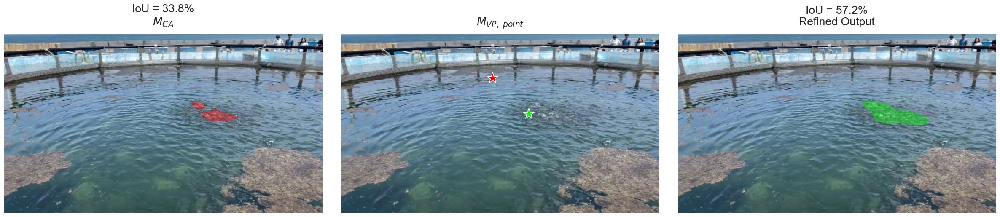

✅ 已輸出 POINT 的高解析寬比例比較圖 (IoU 進步至 57.2%)


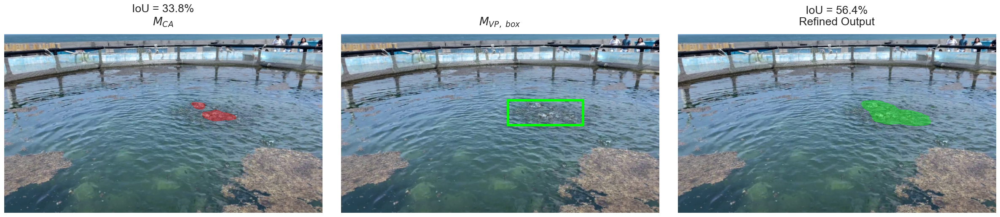

✅ 已輸出 BOX 的高解析寬比例比較圖 (IoU 進步至 56.4%)


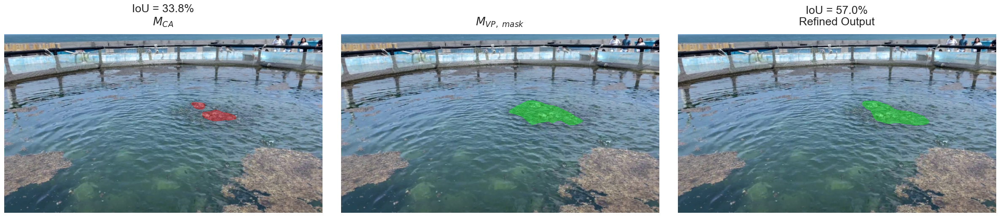

✅ 已輸出 MASK 的高解析寬比例比較圖 (IoU 進步至 57.0%)

🔍 開始處理場域 [ Domain H ]
>>> [Dataset C] H (val): K=1, 分配 1 張。
🎯 找到共用完美範例 (video_20201022_145926_cut_104.jpg)！ Baseline IoU: 0.0%


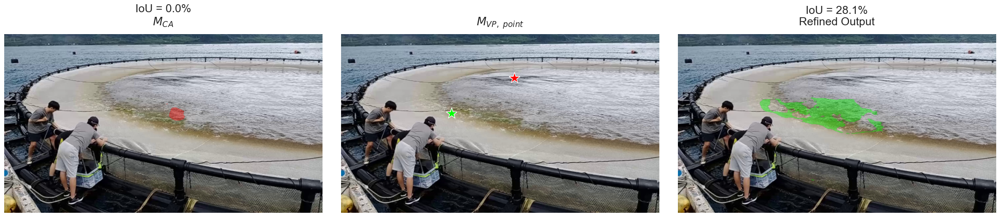

✅ 已輸出 POINT 的高解析寬比例比較圖 (IoU 進步至 28.1%)


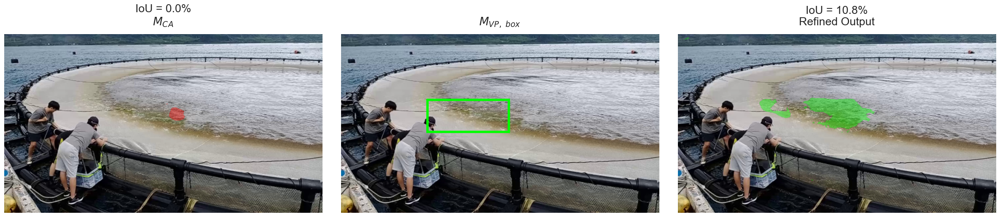

✅ 已輸出 BOX 的高解析寬比例比較圖 (IoU 進步至 10.8%)


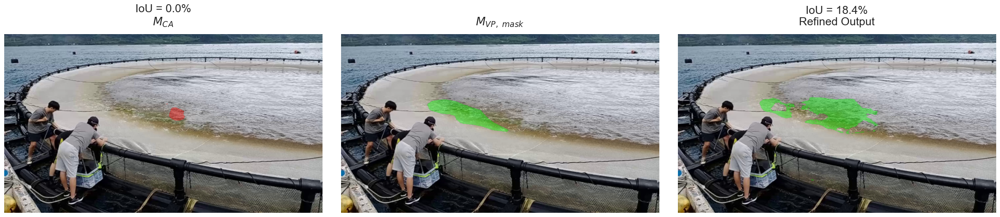

✅ 已輸出 MASK 的高解析寬比例比較圖 (IoU 進步至 18.4%)

🔍 開始處理場域 [ Domain I ]
>>> [Dataset C] I (val): K=1, 分配 1 張。
🎯 找到共用完美範例 (video_20201211_151642_cut_209.jpg)！ Baseline IoU: 0.4%


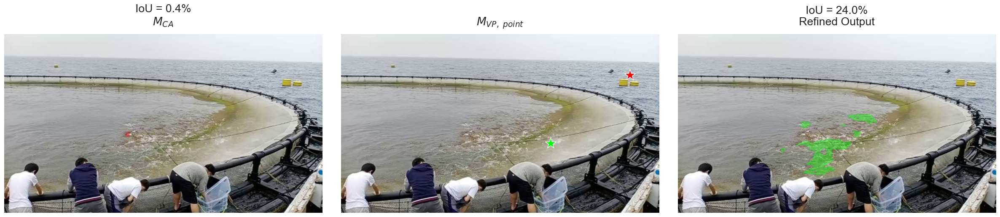

✅ 已輸出 POINT 的高解析寬比例比較圖 (IoU 進步至 24.0%)


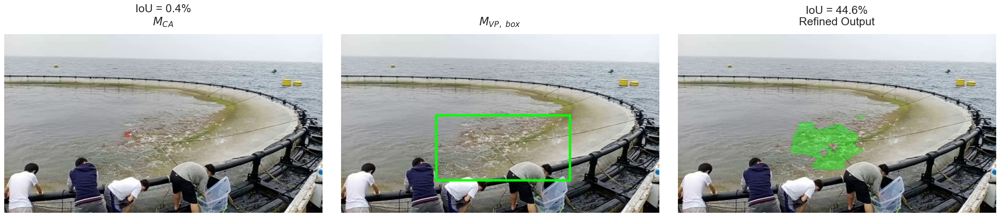

✅ 已輸出 BOX 的高解析寬比例比較圖 (IoU 進步至 44.6%)


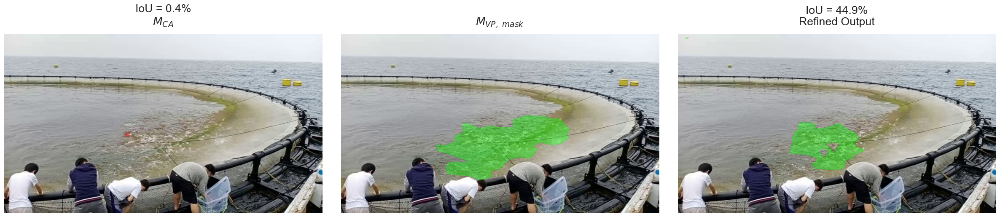

✅ 已輸出 MASK 的高解析寬比例比較圖 (IoU 進步至 44.9%)

🔍 開始處理場域 [ Domain J ]
>>> [Dataset C] J (val): K=1, 分配 1 張。
⚠️ 在場域 J 找不到能讓三種方法同時進步的共用範例，可嘗試放寬門檻。


In [6]:
import os
import sys
import yaml
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch.nn.functional as F
from torch.utils.data import DataLoader
from pathlib import Path
from PIL import Image

# --- 1. 基礎設定與環境初始化 ---
root_path = r"C:\Users\user\PycharmProjects\subclass_segformer"
os.chdir(root_path)
if root_path not in sys.path:
    sys.path.append(root_path)

from dataset import RippleFeatureDataset, find_source_image
from semseg.models.subclass_segformer_unified import SubclassSegFormer_Unified
from util.analysis_algs import MultiInstanceLearning_calculate_w
from util.features_core import extract_mask_positive_instances, extract_point_prompt_instances, get_roi_instances, find_roi_by_bbox

config_path = 'configs/ripple_prompt.yaml'
with open(config_path) as f:
    cfg = yaml.load(f, Loader=yaml.SafeLoader)

unseen_map = cfg['DATASET'].get('UNSEEN_DOMAINS', {})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = SubclassSegFormer_Unified(
    backbone=cfg['MODEL']['BACKBONE'],
    num_classes=2,
    num_prompts=cfg.get('PROMPT_LEARNING', {}).get('NUM_PROMPTS', 5)
)
pretrained_path = cfg['MODEL'].get('PRETRAINED', None)
if pretrained_path:
    checkpoint = torch.load(pretrained_path, map_location='cpu', weights_only=False)
    state_dict = checkpoint.get('state_dict', checkpoint) if isinstance(checkpoint, dict) else checkpoint.state_dict()
    model.load_state_dict(state_dict, strict=False)

model.to(device)
model.eval()

Vb = next((param.detach().cpu().numpy() for name, param in model.named_parameters() if 'Vb' in name), None)


# --- 2. 視覺化輔助函式 ---
def tensor_to_vis_img(img_tensor):
    img_np = img_tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()
    if img_np.min() < 0:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_np = img_np * std + mean
    return np.clip(img_np, 0, 1)

def get_iou_and_mask(output, lbl):
    if output.shape[2:] != lbl.shape[1:]:
        output = F.interpolate(output, size=lbl.shape[1:], mode='bilinear', align_corners=False)
    pred_mask = torch.argmax(output, dim=1).squeeze(0)
    gt = lbl.squeeze(0)
    intersect = torch.logical_and(pred_mask == 1, gt == 1).sum().item()
    union = torch.logical_or(pred_mask == 1, gt == 1).sum().item()
    iou = intersect / (union + 1e-6)
    return iou, pred_mask.cpu().numpy()

def draw_visual_prompt(ax, img_np, lbl_np, method):
    ax.imshow(img_np)
    ax.axis('off')
    # 因為還原回高解析度原圖，稍微加大 markersize 與 linewidth 避免圖示太小
    if method == 'point':
        pos_y, pos_x = np.where(lbl_np == 1)
        neg_y, neg_x = np.where(lbl_np == 0)
        if len(pos_x) > 0:
            ax.plot(pos_x[len(pos_x)//2], pos_y[len(pos_y)//2], marker='*', color='lime', markersize=20, markeredgecolor='white', linestyle='None')
        if len(neg_x) > 0:
            ax.plot(neg_x[len(neg_x)//4], neg_y[len(neg_y)//4], marker='*', color='red', markersize=20, markeredgecolor='white', linestyle='None')
    elif method == 'box':
        pos_y, pos_x = np.where(lbl_np == 1)
        if len(pos_x) > 0:
            x_min, x_max = pos_x.min(), pos_x.max()
            y_min, y_max = pos_y.min(), pos_y.max()
            rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, linewidth=4, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
    elif method == 'mask':
        green_mask = np.zeros((*lbl_np.shape, 4))
        green_mask[lbl_np == 1] = [0, 1, 0, 0.4]
        ax.imshow(green_mask)

def overlay_segmentation(ax, img_np, pred_mask, color=[0, 1, 0, 0.4]):
    ax.imshow(img_np)
    overlay = np.zeros((*pred_mask.shape, 4))
    overlay[pred_mask == 1] = color
    ax.imshow(overlay)
    ax.axis('off')


# --- 3. 絕對公平比較：還原真實長寬比 ---
def run_fair_interactive_experiment():
    domains = ['F', 'G', 'H', 'I', 'J']
    max_baseline_iou = 0.50
    min_improvement_all = 0.05
    min_improvement_max = 0.15

    print(f"🚀 啟動【絕對公平比較】實驗！\n目標場域：{domains}\n正在尋找單一 Worst Case...\n")

    for domain in domains:
        print(f"\n{'='*50}")
        print(f"🔍 開始處理場域 [ Domain {domain} ]")
        print(f"{'='*50}")

        if domain not in unseen_map:
            continue

        output_vis_dir = Path(f'output_prompt/visualizations/Domain_{domain}')
        output_vis_dir.mkdir(parents=True, exist_ok=True)

        label_dir = Path(unseen_map[domain])
        all_labels = sorted(list(label_dir.glob('*.png')))
        paired_pool = [(str(find_source_image(str(lbl))), str(lbl)) for lbl in all_labels if find_source_image(str(lbl))]

        dataset = RippleFeatureDataset(root=cfg['DATASET']['ROOT'], field=[domain], split='val', sample_num=1, unseen_map=unseen_map)
        dataset.files = paired_pool
        dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

        golden_target = None

        with torch.no_grad():
            for idx, (img, lbl) in enumerate(dataloader):
                img_device, lbl_device = img.to(device), lbl.to(device)

                output_base, subclass_map = model(img_device)
                iou_base, _ = get_iou_and_mask(output_base, lbl_device)

                if iou_base > max_baseline_iou or lbl_device.sum() == 0:
                    continue

                method_results = {}
                failed_extraction = False

                for method in ['point', 'box', 'mask']:
                    if method == 'mask':
                        p_inst, n_inst = extract_mask_positive_instances(subclass_map, lbl_device, need_negative=True)
                    elif method == 'box':
                        mask_200 = F.interpolate(lbl_device.unsqueeze(0).float(), size=(200, 200), mode='nearest').squeeze().cpu().numpy()
                        _, roi_box, _ = find_roi_by_bbox(mask_200, margin_px=20)
                        p_inst, n_inst = get_roi_instances(subclass_map, roi_box, need_negative=True)
                    elif method == 'point':
                        p_inst, n_inst = extract_point_prompt_instances(subclass_map, lbl_device, kernel_size=7, need_negative=True)

                    if p_inst is None or len(p_inst) == 0:
                        failed_extraction = True
                        break

                    all_p = p_inst.cpu()
                    all_n = n_inst.cpu() if (n_inst is not None and len(n_inst) > 0) else None
                    optimized_weight = MultiInstanceLearning_calculate_w(all_p, all_n, Vb)

                    output_prompt, _ = model(img_device, subclass_weight=optimized_weight.to(device))
                    iou_prompt, _ = get_iou_and_mask(output_prompt, lbl_device)

                    # 這裡先保留原始的 output_results tensor，晚點要一起放大
                    method_results[method] = {
                        'iou_prompt': iou_prompt,
                        'raw_output': output_prompt.clone()
                    }

                if failed_extraction or len(method_results) < 3:
                    continue

                improvements = [res['iou_prompt'] - iou_base for res in method_results.values()]

                if all(imp >= min_improvement_all for imp in improvements) and max(improvements) >= min_improvement_max:

                    # ✅ 抓取該圖的「真實長寬尺寸」
                    img_path = paired_pool[idx][0]
                    orig_w, orig_h = Image.open(img_path).size

                    # ✅ 1. 把模型 Tensor 影像等比例放大回真實尺寸
                    img_restored = F.interpolate(img_device, size=(orig_h, orig_w), mode='bilinear', align_corners=False)
                    query_img_vis = tensor_to_vis_img(img_restored)

                    # ✅ 2. 把 Label 放大回真實尺寸
                    lbl_restored = F.interpolate(lbl_device.unsqueeze(0).float(), size=(orig_h, orig_w), mode='nearest')
                    lbl_np_vis = lbl_restored.squeeze().cpu().numpy()

                    # ✅ 3. 把 Baseline 預測放大回真實尺寸
                    output_base_restored = F.interpolate(output_base, size=(orig_h, orig_w), mode='bilinear', align_corners=False)
                    pred_base_np = torch.argmax(output_base_restored, dim=1).squeeze(0).cpu().numpy()

                    # ✅ 4. 把 Prompt 預測放大回真實尺寸
                    for m, res in method_results.items():
                        out_p_restored = F.interpolate(res['raw_output'], size=(orig_h, orig_w), mode='bilinear', align_corners=False)
                        res['pred_prompt'] = torch.argmax(out_p_restored, dim=1).squeeze(0).cpu().numpy()

                    golden_target = {
                        'img': query_img_vis,
                        'lbl': lbl_np_vis,
                        'iou_base': iou_base,
                        'pred_base': pred_base_np,
                        'results': method_results,
                        'filename': Path(img_path).name
                    }
                    print(f"🎯 找到共用完美範例 ({golden_target['filename']})！ Baseline IoU: {iou_base*100:.1f}%")
                    break

        if not golden_target:
            print(f"⚠️ 在場域 {domain} 找不到能讓三種方法同時進步的共用範例，可嘗試放寬門檻。")
            continue

        for method in ['point', 'box', 'mask']:
            # ✅ 將畫布尺寸大幅加寬至 24x6，並縮小圖與圖之間的留白
            fig, axes = plt.subplots(1, 3, figsize=(24, 6))
            plt.rcParams.update({'font.size': 16})

            res = golden_target['results'][method]

            overlay_segmentation(axes[0], golden_target['img'], golden_target['pred_base'], color=[1, 0, 0, 0.4])
            axes[0].set_title(f"IoU = {golden_target['iou_base']*100:.1f}%\n$M_{{CA}}$", pad=15)

            draw_visual_prompt(axes[1], golden_target['img'], golden_target['lbl'], method)
            title_mid = f"$M_{{VP,\\ {method}}}\ $"
            axes[1].set_title(f"\n{title_mid}", pad=15)

            overlay_segmentation(axes[2], golden_target['img'], res['pred_prompt'], color=[0, 1, 0, 0.4])
            axes[2].set_title(f"IoU = {res['iou_prompt']*100:.1f}%\nRefined Output", pad=15)

            # 使用 tight_layout 搭配 w_pad 讓寬圖更好看
            plt.tight_layout(w_pad=2.0)
            save_name = f"fair_comparison_{golden_target['filename'].split('.')[0]}_{method}.png"
            save_path = output_vis_dir / save_name
            plt.savefig(save_path, bbox_inches='tight', dpi=300)
            plt.show()
            plt.close(fig)

            print(f"✅ 已輸出 {method.upper()} 的高解析寬比例比較圖 (IoU 進步至 {res['iou_prompt']*100:.1f}%)")

run_fair_interactive_experiment()

🚀 啟動【固定案例】實驗！將直接處理指定的 3 張圖片...


🔍 開始處理場域 [ Domain G ] - 目標檔案: IMG5433_cut_100
>>> [Dataset C] G (val): K=1, 分配 1 張。
🎯 成功處理指定檔案：IMG5433_cut_100 | Baseline IoU: 35.6%


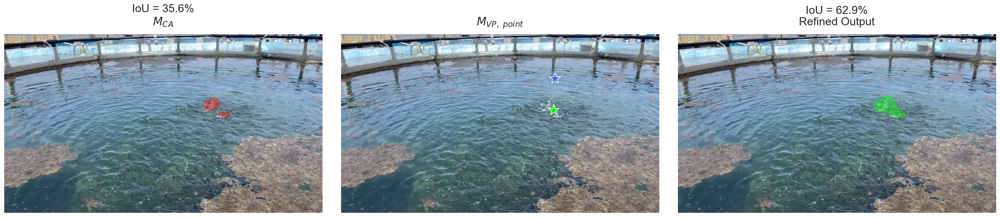

✅ 已輸出 POINT 比較圖 -> fixed_case_IMG5433_cut_100_point.png (IoU: 62.9%)


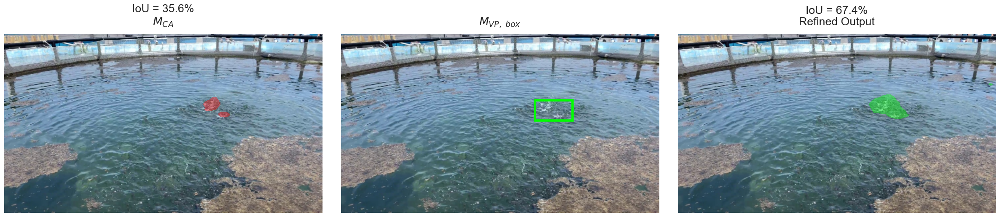

✅ 已輸出 BOX 比較圖 -> fixed_case_IMG5433_cut_100_box.png (IoU: 67.4%)


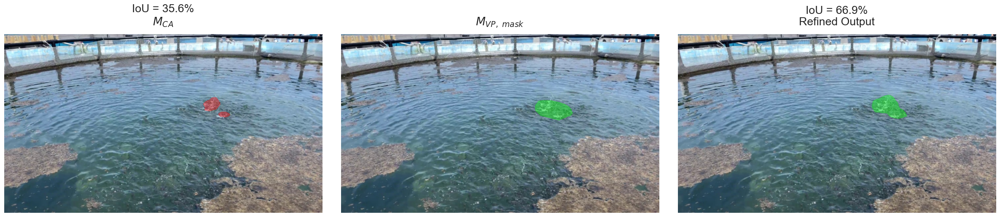

✅ 已輸出 MASK 比較圖 -> fixed_case_IMG5433_cut_100_mask.png (IoU: 66.9%)

🔍 開始處理場域 [ Domain H ] - 目標檔案: video_20201022_145926_cut_107
>>> [Dataset C] H (val): K=1, 分配 1 張。
🎯 成功處理指定檔案：video_20201022_145926_cut_107 | Baseline IoU: 24.1%


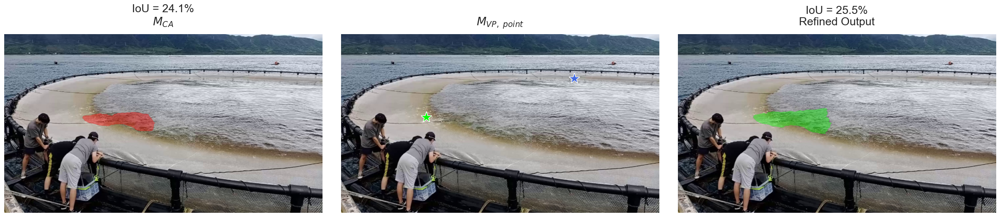

✅ 已輸出 POINT 比較圖 -> fixed_case_video_20201022_145926_cut_107_point.png (IoU: 25.5%)


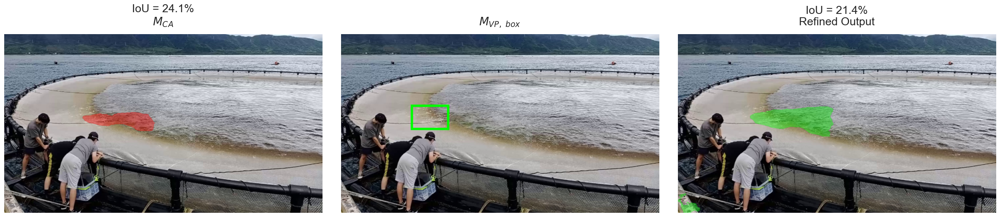

✅ 已輸出 BOX 比較圖 -> fixed_case_video_20201022_145926_cut_107_box.png (IoU: 21.4%)


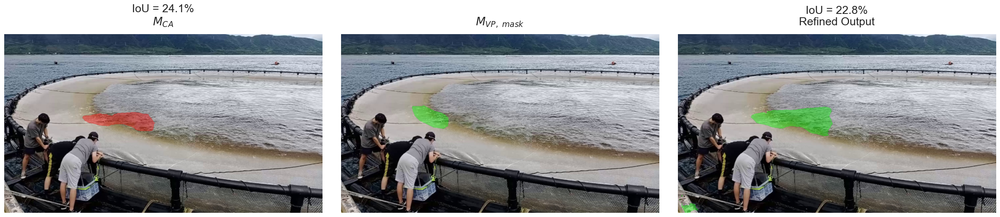

✅ 已輸出 MASK 比較圖 -> fixed_case_video_20201022_145926_cut_107_mask.png (IoU: 22.8%)

🔍 開始處理場域 [ Domain I ] - 目標檔案: video_20201211_151642_cut_204
>>> [Dataset C] I (val): K=1, 分配 1 張。
🎯 成功處理指定檔案：video_20201211_151642_cut_204 | Baseline IoU: 32.3%


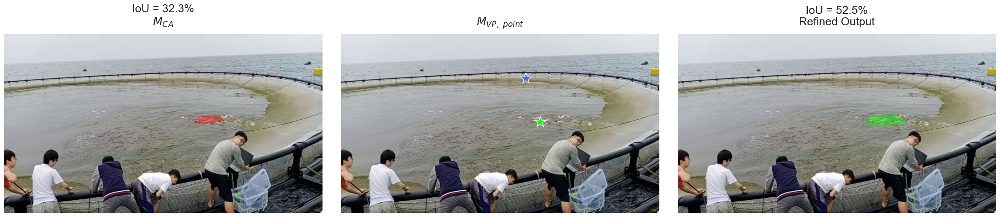

✅ 已輸出 POINT 比較圖 -> fixed_case_video_20201211_151642_cut_204_point.png (IoU: 52.5%)


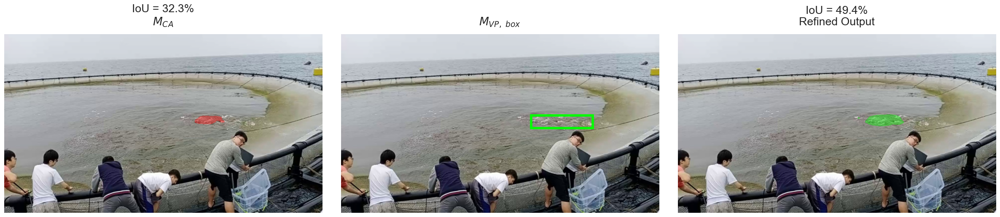

✅ 已輸出 BOX 比較圖 -> fixed_case_video_20201211_151642_cut_204_box.png (IoU: 49.4%)


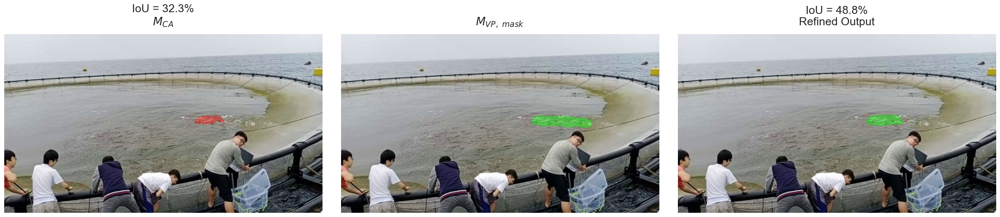

✅ 已輸出 MASK 比較圖 -> fixed_case_video_20201211_151642_cut_204_mask.png (IoU: 48.8%)


In [2]:
import os
import sys
import yaml
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch.nn.functional as F
from torch.utils.data import DataLoader
from pathlib import Path
from PIL import Image

# --- 1. 基礎設定與環境初始化 ---
root_path = r"C:\Users\user\PycharmProjects\subclass_segformer"
os.chdir(root_path)
if root_path not in sys.path:
    sys.path.append(root_path)

from dataset import RippleFeatureDataset, find_source_image
from semseg.models.subclass_segformer_unified import SubclassSegFormer_Unified
from util.analysis_algs import MultiInstanceLearning_calculate_w
from util.features_core import extract_mask_positive_instances, extract_point_prompt_instances, get_roi_instances, find_roi_by_bbox

config_path = 'configs/ripple_prompt.yaml'
with open(config_path) as f:
    cfg = yaml.load(f, Loader=yaml.SafeLoader)

unseen_map = cfg['DATASET'].get('UNSEEN_DOMAINS', {})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = SubclassSegFormer_Unified(
    backbone=cfg['MODEL']['BACKBONE'],
    num_classes=2,
    num_prompts=cfg.get('PROMPT_LEARNING', {}).get('NUM_PROMPTS', 5)
)
pretrained_path = cfg['MODEL'].get('PRETRAINED', None)
if pretrained_path:
    checkpoint = torch.load(pretrained_path, map_location='cpu', weights_only=False)
    state_dict = checkpoint.get('state_dict', checkpoint) if isinstance(checkpoint, dict) else checkpoint.state_dict()
    model.load_state_dict(state_dict, strict=False)

model.to(device)
model.eval()

Vb = next((param.detach().cpu().numpy() for name, param in model.named_parameters() if 'Vb' in name), None)


# --- 2. 視覺化輔助函式 ---
def tensor_to_vis_img(img_tensor):
    img_np = img_tensor.squeeze(0).permute(1, 2, 0).cpu().numpy()
    if img_np.min() < 0:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_np = img_np * std + mean
    return np.clip(img_np, 0, 1)

def get_iou_and_mask(output, lbl):
    if output.shape[2:] != lbl.shape[1:]:
        output = F.interpolate(output, size=lbl.shape[1:], mode='bilinear', align_corners=False)
    pred_mask = torch.argmax(output, dim=1).squeeze(0)
    gt = lbl.squeeze(0)
    intersect = torch.logical_and(pred_mask == 1, gt == 1).sum().item()
    union = torch.logical_or(pred_mask == 1, gt == 1).sum().item()
    iou = intersect / (union + 1e-6)
    return iou, pred_mask.cpu().numpy()

def draw_visual_prompt(ax, img_np, lbl_np, method):
    ax.imshow(img_np)
    ax.axis('off')
    if method == 'point':
        pos_y, pos_x = np.where(lbl_np == 1)
        neg_y, neg_x = np.where(lbl_np == 0)
        if len(pos_x) > 0:
            ax.plot(pos_x[len(pos_x)//2], pos_y[len(pos_y)//2], marker='*', color='lime', markersize=20, markeredgecolor='white', linestyle='None')
        if len(neg_x) > 0:
            ax.plot(neg_x[len(neg_x)//4], neg_y[len(neg_y)//4], marker='*', color='royalblue', markersize=20, markeredgecolor='white', linestyle='None')
    elif method == 'box':
        pos_y, pos_x = np.where(lbl_np == 1)
        if len(pos_x) > 0:
            x_min, x_max = pos_x.min(), pos_x.max()
            y_min, y_max = pos_y.min(), pos_y.max()
            rect = patches.Rectangle((x_min, y_min), x_max-x_min, y_max-y_min, linewidth=4, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
    elif method == 'mask':
        green_mask = np.zeros((*lbl_np.shape, 4))
        green_mask[lbl_np == 1] = [0, 1, 0, 0.4]
        ax.imshow(green_mask)

def overlay_segmentation(ax, img_np, pred_mask, color=[0, 1, 0, 0.4]):
    ax.imshow(img_np)
    overlay = np.zeros((*pred_mask.shape, 4))
    overlay[pred_mask == 1] = color
    ax.imshow(overlay)
    ax.axis('off')


# --- 3. 固定目標案例執行實驗 ---
def run_fixed_target_experiment():
    # ✅ 定義你想直接抓取的 Domain 與對應檔名 (不含副檔名，以防 jpg/png 不一致)
    target_cases = {
        'G': 'IMG5433_cut_100',
        'H': 'video_20201022_145926_cut_107',
        'I': 'video_20201211_151642_cut_204'
    }

    print(f"🚀 啟動【固定案例】實驗！將直接處理指定的 3 張圖片...\n")

    for domain, target_stem in target_cases.items():
        print(f"\n{'='*50}")
        print(f"🔍 開始處理場域 [ Domain {domain} ] - 目標檔案: {target_stem}")
        print(f"{'='*50}")

        if domain not in unseen_map:
            print(f"⚠️ 找不到場域 {domain} 的路徑設定，略過。")
            continue

        output_vis_dir = Path(f'output_prompt/visualizations/Domain_{domain}')
        output_vis_dir.mkdir(parents=True, exist_ok=True)

        label_dir = Path(unseen_map[domain])
        all_labels = list(label_dir.glob('*.png'))

        # 在該 Domain 尋找對應的 label 檔案
        target_label_path = next((lbl for lbl in all_labels if target_stem in lbl.name), None)

        if not target_label_path:
            print(f"❌ 找不到目標檔案 {target_stem}，請確認名稱是否正確，略過此案例。")
            continue

        target_img_path = find_source_image(str(target_label_path))
        if not target_img_path:
            print(f"❌ 找不到 {target_stem} 的原始影像檔，略過此案例。")
            continue

        # 只把這「唯一的一對」影像放進 Dataset
        paired_pool = [(str(target_img_path), str(target_label_path))]

        dataset = RippleFeatureDataset(root=cfg['DATASET']['ROOT'], field=[domain], split='val', sample_num=1, unseen_map=unseen_map)
        dataset.files = paired_pool
        dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

        with torch.no_grad():
            for img, lbl in dataloader:
                img_device, lbl_device = img.to(device), lbl.to(device)

                # 計算 Baseline
                output_base, subclass_map = model(img_device)
                iou_base, _ = get_iou_and_mask(output_base, lbl_device)

                method_results = {}
                failed_extraction = False

                # 分別計算三種 Prompt
                for method in ['point', 'box', 'mask']:
                    if method == 'mask':
                        p_inst, n_inst = extract_mask_positive_instances(subclass_map, lbl_device, need_negative=True)
                    elif method == 'box':
                        mask_200 = F.interpolate(lbl_device.unsqueeze(0).float(), size=(200, 200), mode='nearest').squeeze().cpu().numpy()
                        _, roi_box, _ = find_roi_by_bbox(mask_200, margin_px=20)
                        p_inst, n_inst = get_roi_instances(subclass_map, roi_box, need_negative=True)
                    elif method == 'point':
                        p_inst, n_inst = extract_point_prompt_instances(subclass_map, lbl_device, kernel_size=7, need_negative=True)

                    if p_inst is None or len(p_inst) == 0:
                        print(f"⚠️ {method.upper()} 無法抽取特徵。")
                        failed_extraction = True
                        break

                    all_p = p_inst.cpu()
                    all_n = n_inst.cpu() if (n_inst is not None and len(n_inst) > 0) else None
                    optimized_weight = MultiInstanceLearning_calculate_w(all_p, all_n, Vb)

                    output_prompt, _ = model(img_device, subclass_weight=optimized_weight.to(device))
                    iou_prompt, _ = get_iou_and_mask(output_prompt, lbl_device)

                    method_results[method] = {
                        'iou_prompt': iou_prompt,
                        'raw_output': output_prompt.clone()
                    }

                if failed_extraction:
                    continue

                # ✅ 直接抓取真實尺寸並放大 (無條件執行，不檢查 IoU)
                orig_w, orig_h = Image.open(str(target_img_path)).size

                img_restored = F.interpolate(img_device, size=(orig_h, orig_w), mode='bilinear', align_corners=False)
                query_img_vis = tensor_to_vis_img(img_restored)

                lbl_restored = F.interpolate(lbl_device.unsqueeze(0).float(), size=(orig_h, orig_w), mode='nearest')
                lbl_np_vis = lbl_restored.squeeze().cpu().numpy()

                output_base_restored = F.interpolate(output_base, size=(orig_h, orig_w), mode='bilinear', align_corners=False)
                pred_base_np = torch.argmax(output_base_restored, dim=1).squeeze(0).cpu().numpy()

                for m, res in method_results.items():
                    out_p_restored = F.interpolate(res['raw_output'], size=(orig_h, orig_w), mode='bilinear', align_corners=False)
                    res['pred_prompt'] = torch.argmax(out_p_restored, dim=1).squeeze(0).cpu().numpy()

                print(f"🎯 成功處理指定檔案：{target_stem} | Baseline IoU: {iou_base*100:.1f}%")

                # --- 開始繪製並輸出三張對比圖 ---
                for method in ['point', 'box', 'mask']:
                    fig, axes = plt.subplots(1, 3, figsize=(24, 6)) # 保持寬螢幕高解析度
                    plt.rcParams.update({'font.size': 16})

                    res = method_results[method]

                    overlay_segmentation(axes[0], query_img_vis, pred_base_np, color=[1, 0, 0, 0.4])
                    axes[0].set_title(f"IoU = {iou_base*100:.1f}%\n$M_{{CA}}$", pad=15)

                    draw_visual_prompt(axes[1], query_img_vis, lbl_np_vis, method)
                    title_mid = f"$M_{{VP,\\ {method}}}\ $"
                    axes[1].set_title(f"\n{title_mid}", pad=15)

                    overlay_segmentation(axes[2], query_img_vis, res['pred_prompt'], color=[0, 1, 0, 0.4])
                    axes[2].set_title(f"IoU = {res['iou_prompt']*100:.1f}%\nRefined Output", pad=15)

                    plt.tight_layout(w_pad=2.0)
                    save_name = f"fixed_case_{target_stem}_{method}.png"
                    save_path = output_vis_dir / save_name
                    plt.savefig(save_path, bbox_inches='tight', dpi=300)
                    plt.show()
                    plt.close(fig)

                    print(f"✅ 已輸出 {method.upper()} 比較圖 -> {save_name} (IoU: {res['iou_prompt']*100:.1f}%)")

run_fixed_target_experiment()